# Feature Visualization

In [1]:
import numpy as np
import pandas as pd 
import h5py
import matplotlib.pyplot as plt
import os
from PIL import Image
import time

from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

%matplotlib inline

data_root = '/home/cathy/repos/kaggle-yelp/'

## read in business attributes
`train_photo_to_biz_ids.csv` - maps the photo id to business id

In [2]:
train_photo_to_biz = pd.read_csv(data_root + 'train_photo_to_biz_ids.csv')
train_photo_to_biz.head()

,photo_id,business_id
0,204149,3034
1,52779,2805
2,278973,485
3,195284,485
4,19992,485


`train.csv` - main training dataset. Includes the business ids, and their corresponding labels

In [3]:
train_biz_labels = pd.read_csv(data_root + 'train.csv', index_col = 0)
train_biz_labels.head()

,labels
business_id,
1000,1 2 3 4 5 6 7
1001,0 1 6 8
100,1 2 4 5 6 7
1006,1 2 4 5 6
1010,0 6 8


In [4]:
# convert label vectors to indicator matrix
train_biz_labels_dummies = train_biz_labels['labels'].str.get_dummies(' ')
train_biz_labels_dummies.head()

,0,1,2,3,4,5,6,7,8
business_id,,,,,,,,,
1000,0,1,1,1,1,1,1,1,0
1001,1,1,0,0,0,0,1,0,1
100,0,1,1,0,1,1,1,1,0
1006,0,1,1,0,1,1,1,0,0
1010,1,0,0,0,0,0,1,0,1


Create a dictionary for yelp attributes

In [5]:
#############################  Yelp Attributes #############################
#0: good_for_lunch                    5: has_alcohol
#1: good_for_dinner                   6: has_table_service  
#2: takes_reservations                7: ambience_is_classy
#3: outdoor_seating                   8: good_for_kids
#4: restaurant_is_expensive
############################################################################
attributes = ['good for lunch', 'good for dinner', 'takes reservations', 'outdoor seating',
              'restaurant is expensive', 'has alcohol', 'has table service', 'ambience is classy', 
              'good for kids']
yelp_dict = dict(enumerate(attributes))

## Visualize predicted class per image, the class with the maximum value in the 1000-dim probability vectors

Load ImageNet labels, located in directory caffe_root + 'data/ilsvrc12/synset_words.txt'.
The list is also available at http://dl.caffe.berkeleyvision.org/caffe_ilsvrc12.tar.gz

In [6]:
with open(data_root + 'synset_words.txt') as f: ImageNet_labels = f.read()
    
ImageNet_labels = ImageNet_labels.splitlines()
print(ImageNet_labels[:3])

# remove irrelevant first 10 characters in labels
ImageNet_labels = [x[10:] for x in ImageNet_labels]
print('\n',ImageNet_labels[:3])

['n01440764 tench, Tinca tinca', 'n01443537 goldfish, Carassius auratus', 'n01484850 great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias']

 ['tench, Tinca tinca', 'goldfish, Carassius auratus', 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias']


Define some helper functions

In [8]:
def load_photo_features(filename, features_dir = 'features/'):
    """
    Load photo features, saved in hdf5 format.
    
    INPUT:
    filename - string, name of hdf5 file, not including data_root path
    features_dir - string, name of subdirectory of data_root under which hdf5 files are stored
    
    RETURNS:
    photo_id - numpy array (a vector of integers)
    features - numpy array (2-d array of floats)
    """
    
    f = h5py.File(data_root + features_dir + filename, 'r')
    photo_id = np.copy(f['photo_id'])
    features = np.copy(f['feature'])
    f.close()
    
    # split photo id (remove file extension .jpg), e.g. b'204149.jpg'
    photo_id_split = np.core.defchararray.split(photo_id, b'.')

    if len(photo_id_split[0]) == 2:
        # select first element of split string (containing photo_id.jpg).  
        photo_id = np.array([int(x[0].decode()) for x in photo_id_split])
        
        print('photo_id shape: ', photo_id.shape)
        print('first few photo ids: ', photo_id[0:3])
        print('features shape: ', features.shape)
        
        return photo_id, features
    else: 
        print('photo_id has different format from expected format, e.g. 204149.jpg')
        return []

In [30]:
def visualize_photos(photos_to_show, photo_label, num_images_on_axis = 5):
    """Visualize example photos in a grid, with predicted class as titles
    
    INPUT:
    photos_to_show - list of integer photo_ids (without absolute path or .jpg extension), ex: 337513
    photo_label - list (same length as photos_to_show) of strings, i.e. the predicted classes
    num_images_on_axis - integer, number photos on axis of square grid of photos
    """
    plt.rcParams['figure.figsize'] = (25.0, 25.0) # set default size of plots
    
    for x in range(num_images_on_axis ** 2):    
        plt.subplot(num_images_on_axis, num_images_on_axis, x+1)
        im = Image.open(data_root + 'train_photos/' + str(photos_to_show[x]) +'.jpg')
        plt.imshow(im)
        plt.axis('off')
        plt.title(photo_label[x][:35])

In [26]:
def example_photos_to_plot(lower_cutoff, upper_cutoff, num_photos=25):
    """
    Randomly choose examples of photos whose predicted class occurs a certain number of times,
    specified by lower- and upper-cutoff, in the training set.
    
    Accesses outside of function 
    - label_counts, data frame containing counts (column 'count') of class occurrences 
    per label (column 'top_class') in the training set
    - train_probs, data frame with columns ImageNet_label, photo_id, top_class
    
    INPUT:
    lower_cutoff - integer, inclusive
    upper_cutoff - integer, inclusive
    num_photos - integer, number of examples to select
    
    RETURN:
    photos_to_show - list of integer photo_ids (without absolute path or .jpg extension), ex: 337513
    photo_label - list (same length as photos_to_show) of strings, i.e. the predicted classes
    """
    criterion = label_counts['count'].map(lambda x: x >= lower_cutoff and x <= upper_cutoff) 
    
    # (integer) labels that satisfy constraints on occurrence
    subset_labels = label_counts[criterion].index
    
    # rows (photos) whose top_class is in subset_labels
    subset_train_probs = train_probs[train_probs.top_class.isin(subset_labels)]
    
    # sample from the rows
    mask = np.random.choice(range(len(subset_train_probs.index)), size=num_photos, replace=False)
    photos_to_show = subset_train_probs.iloc[mask].photo_id.tolist()
    photo_label = subset_train_probs.iloc[mask].ImageNet_label.tolist()
    
    return photos_to_show, photo_label

Load softmax (predicted class probabilities) features

In [11]:
photo_id, features = load_photo_features('train_prob_features.h5')

photo_id shape:  (234842,)
first few photo ids:  [204149  52779 278973]
features shape:  (234842, 1000)


Get the ImageNet label index corresponding to the most probable class per photo

In [12]:
top_class_per_photo = np.argmax(features, axis=1)
top_label = ["{0}: {1}".format(idx, ImageNet_labels[idx]) for idx in top_class_per_photo]

train_probs = pd.DataFrame({'photo_id': photo_id, 
                            'top_class': top_class_per_photo,
                            'ImageNet_label': top_label})
train_probs.head(10)

,ImageNet_label,photo_id,top_class
0,"928: ice cream, icecream",204149,928
1,966: red wine,52779,966
2,"894: wardrobe, closet, press",278973,894
3,"706: patio, terrace",195284,706
4,"580: greenhouse, nursery, glasshouse",19992,580
5,"762: restaurant, eating house, eating place, e...",80748,762
6,441: beer glass,444996,441
7,"926: hot pot, hotpot",200285,926
8,398: abacus,90572,398
9,965: burrito,27565,965


In [13]:
# Count number of photos per ImageNet label category and write to text file
label_counts = pd.DataFrame({'top_class': train_probs['ImageNet_label'].value_counts().index,
                             'count': train_probs['top_class'].value_counts()})
# write to csv
label_counts.to_csv(data_root + 'train_pred_class_counts.csv', sep='\t')

label_counts.head(5)

,count,top_class
923,37701,923: plate
962,9379,"962: meat loaf, meatloaf"
762,8444,"762: restaurant, eating house, eating place, e..."
965,7911,965: burrito
925,7066,925: consomme


What is the distribution of class frequencies among the photos?

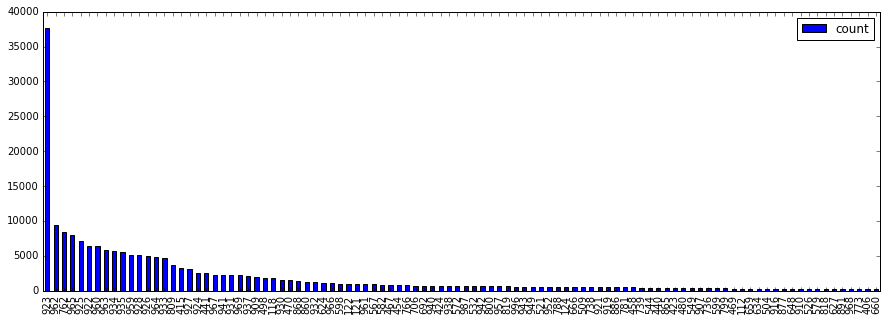

In [19]:
label_counts.iloc[:100,:].plot(y='count', kind='bar', figsize=(15,5))

In [23]:
# how many labels occur only once in the training set?
len(label_counts[label_counts['count'] == 1])

55

Look at examples of classifications, plotted in groups based on number of times label occurred in the training set.  Classes with high counts are more likely to be correct than classes with low counts.

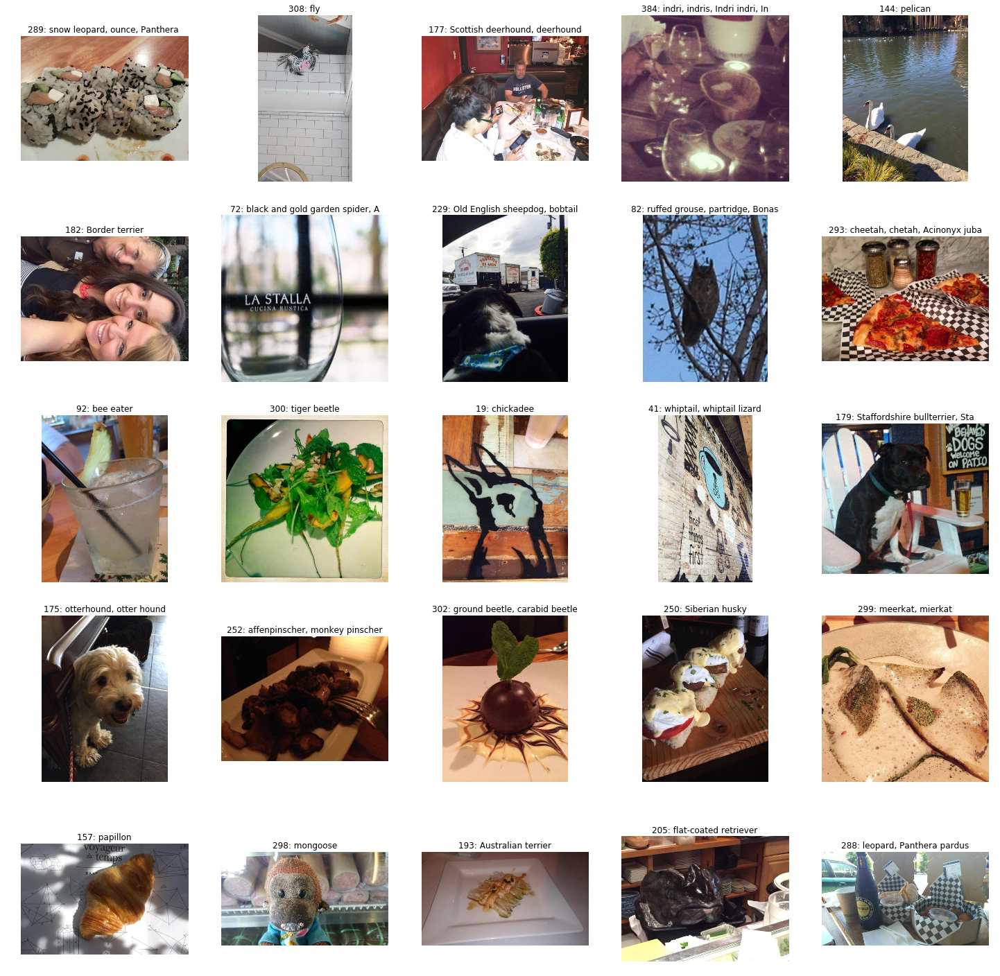

In [31]:
# photos tagged with classes that only occur once in the training set
photos_to_show, photo_label = example_photos_to_plot(1,1, 25)
visualize_photos(photos_to_show, photo_label, 5)

Predictions for specific dog breeds are accurate (above), but otherwise we have wildly inaccurate classifications.

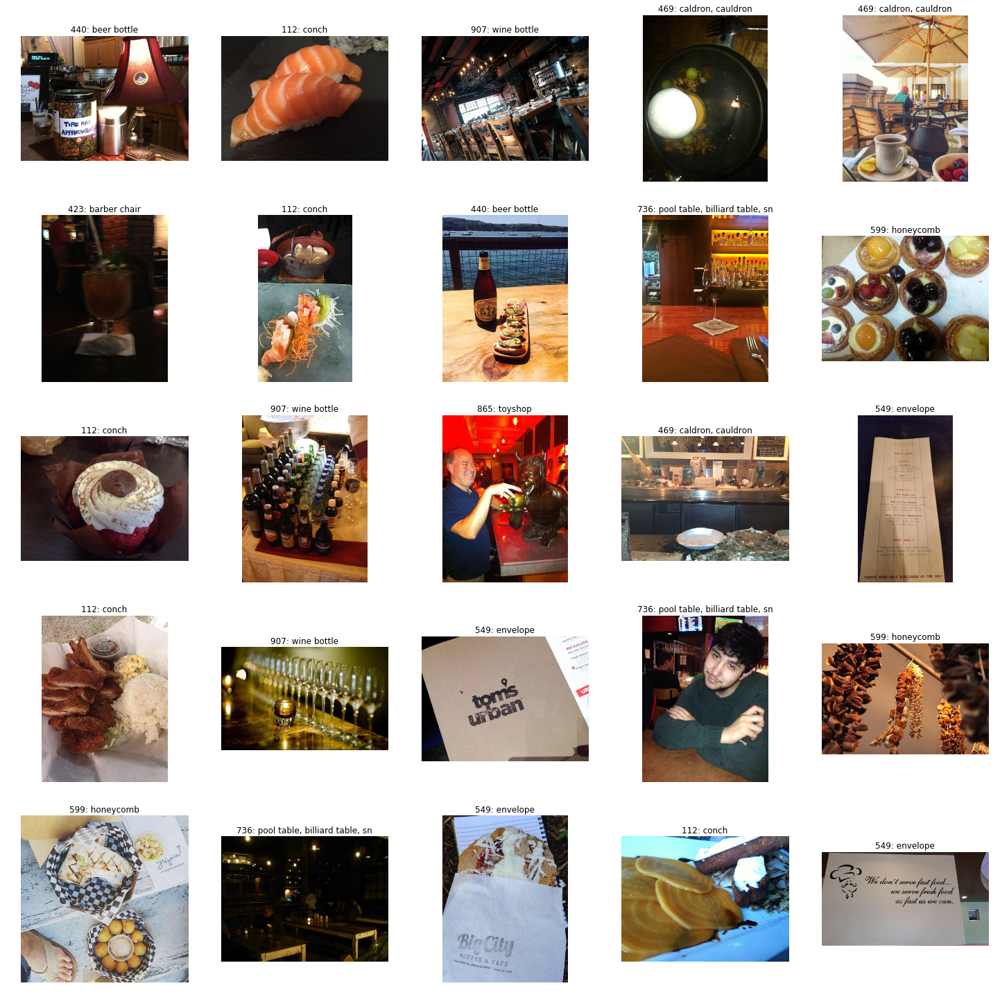

In [35]:
photos_to_show, photo_label = example_photos_to_plot(300,400, 25)
visualize_photos(photos_to_show, photo_label, 5)

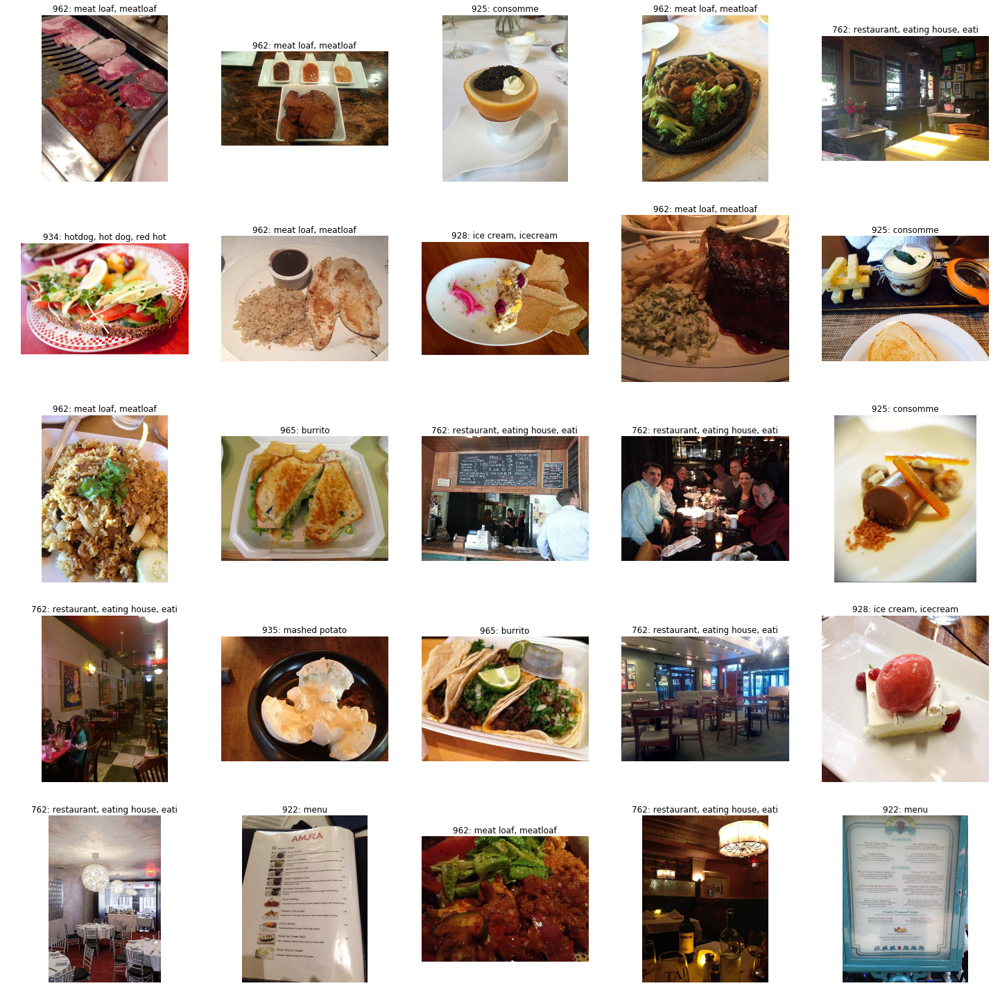

In [33]:
photos_to_show, photo_label = example_photos_to_plot(5000,10000, 25)
visualize_photos(photos_to_show, photo_label, 5)

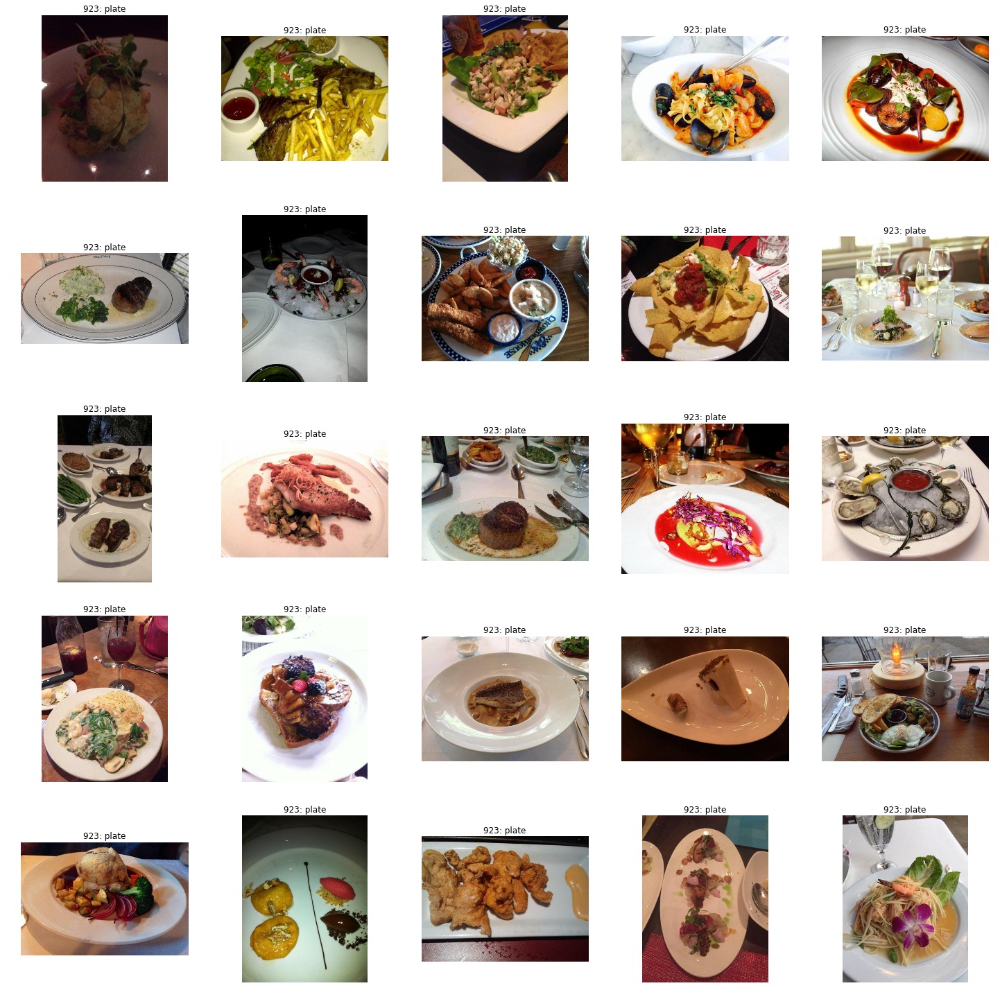

In [34]:
# visualize photos predicted to be "plate" (the only class that occurs > 30000 times in the training set)
photos_to_show, photo_label = example_photos_to_plot(30000,40000, 25)
visualize_photos(photos_to_show, photo_label, 5)

Clearly, there are a lot of misclassifications (although the net does well on specific dog breeds), so an aggregation approach like tf-idf of tokens (predicted classes of single photo instances) per document (restaurant) would not work well here.

However, predictions of the classes "907: wine bottle" and "440: beer bottle" (and possibly also "441: beer glass", "572: goblet", and "966: red wine") seem to be accurate and could be useful for predicting the Yelp attribute "5: has alcohol".

340 photos are labeled as class wine bottle
400 photos are labeled as class beer bottle
2498 photos are labeled as class beer glass
672 photos are labeled as class goblet
1088 photos are labeled as class red wine


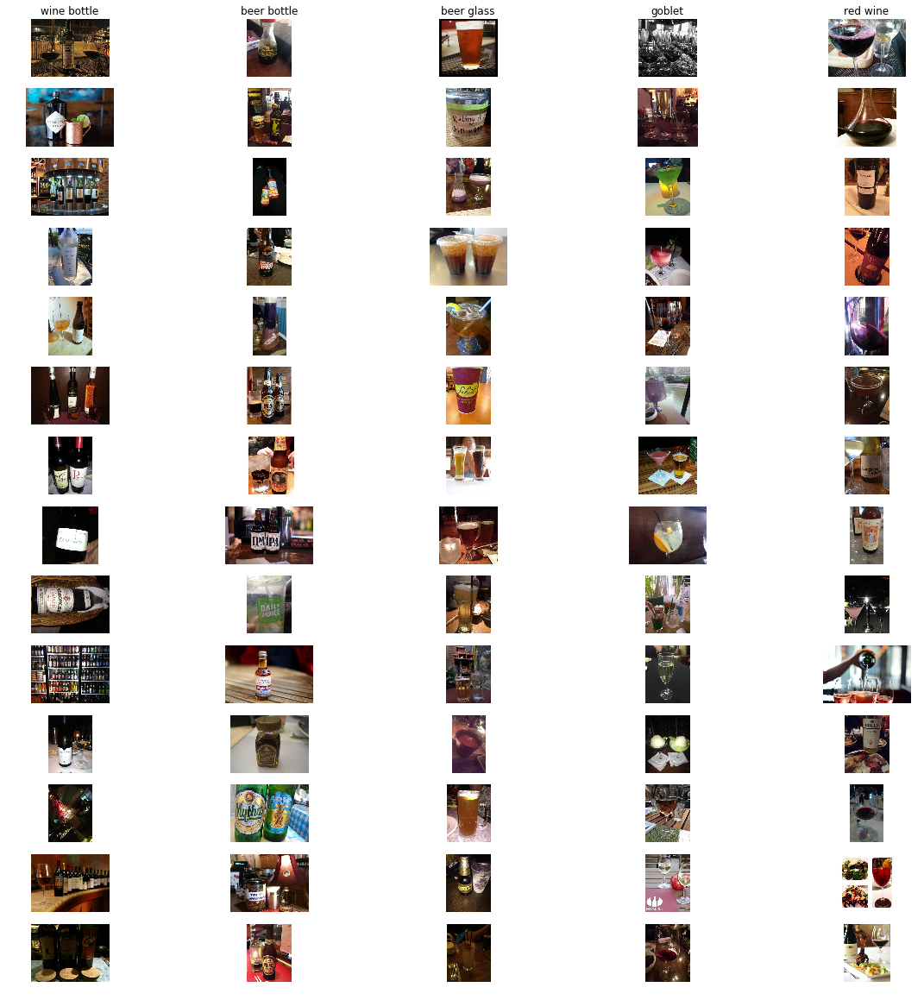

In [36]:
# plot some images predicted to be in classes related to alcohol
plt.rcParams['figure.figsize'] = (20.0, 20.0)

alcohol_classes = [907, 440, 441, 572, 966]

num_classes = len(alcohol_classes)
samples_per_class = 14

for y, cls in enumerate(alcohol_classes):
    idxs = np.flatnonzero(train_probs.top_class == cls)
    
    print("{0} photos are labeled as class {1}".format(len(idxs), ImageNet_labels[cls]))
    
    idxs = np.random.choice(idxs, samples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt_idx = i * num_classes + y + 1
        plt.subplot(samples_per_class, num_classes, plt_idx)
        im = Image.open(data_root + 'train_photos/' + str(train_probs.iloc[idx].photo_id) +'.jpg')
        plt.imshow(im)
        plt.axis('off')
        if i == 0:
            plt.title(ImageNet_labels[cls])

The neural net does a pretty good job identifying alcoholic drinks, so consider using the probabilities of these particular classes from the 1000-dim softmax vector for predicting the "5: has alcohol" attribute.

## Multi-instance problem fc7 
Take the average over the fc7 feature vectors, grouping by business_id, in order to obtain a single vector representation of each business.

In [37]:
# Load fc7 features for training set
photo_id, features_fc7 = load_photo_features('train_fc7_features.h5')

photo_id shape:  (234842,)
first few photo ids:  [204149  52779 278973]
features shape:  (234842, 4096)


In [69]:
# calculate mean fc7 features per business_id

fc7_means_per_business = np.zeros((len(train_biz_labels),features_fc7.shape[1]))

photo_id_Series = pd.Series(photo_id)

tic = time.time()

for idx, b in enumerate(train_biz_labels.index):
    photos_of_b = train_photo_to_biz.loc[train_photo_to_biz['business_id'] == b, 'photo_id']
    mask = np.array(photo_id_Series.isin(photos_of_b))
    fc7_means_per_business[idx,:] = features_fc7[mask, :].mean(axis=0)
    if idx % 400 == 0: print(idx)

toc = time.time()
print('computed in {0}s'.format(toc-tic))

0
400
800
1200
1600
computed in 23.392974615097046s


In [71]:
# save calculated means to file
pd.DataFrame(fc7_means_per_business, index=train_biz_labels.index).to_csv(data_root+'fc7_means_per_business.csv', index_label='business_id')

## t-SNE (t-distributed Stochastic Neighbor Embedding) visualization

See

- [scikit-learn manifold module](http://scikit-learn.org/stable/modules/manifold.html#t-distributed-stochastic-neighbor-embedding-t-sne)
- [tutorial by Alexander Fabisch](http://alexanderfabisch.github.io/t-sne-in-scikit-learn.html)

In [77]:
X_reduced = TruncatedSVD(n_components=50, random_state=42).fit_transform(fc7_means_per_business)
X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(X_reduced)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 3.782153
[t-SNE] Iteration 25: error = 1.7196431, gradient norm = 0.0084060
[t-SNE] Iteration 50: error = 1.6248270, gradient norm = 0.0088531
[t-SNE] Iteration 75: error = 1.3474213, gradient norm = 0.0018154
[t-SNE] Iteration 100: error = 1.3110808, gradient norm = 0.0039409
[t-SNE] Error after 100 iterations with early exaggeration: 1.311081
[t-SNE] Iteration 125: error = 1.2423601, gradient norm = 0.0015250
[t-SNE] Iteration 150: error = 1.2229313, gradient norm = 0.0021385
[t-SNE] Iteration 175: error = 1.2203192, gradient norm = 0.0028882
[t-SNE] Iteration 200: error = 1.2223744, gradient norm = 0.0032950
[t-SNE] Iteration 225: error = 1.2270616, gradient norm = 0.0033048
[t-SNE] Iteration 225: did not make any progress during the last 30 episodes. 

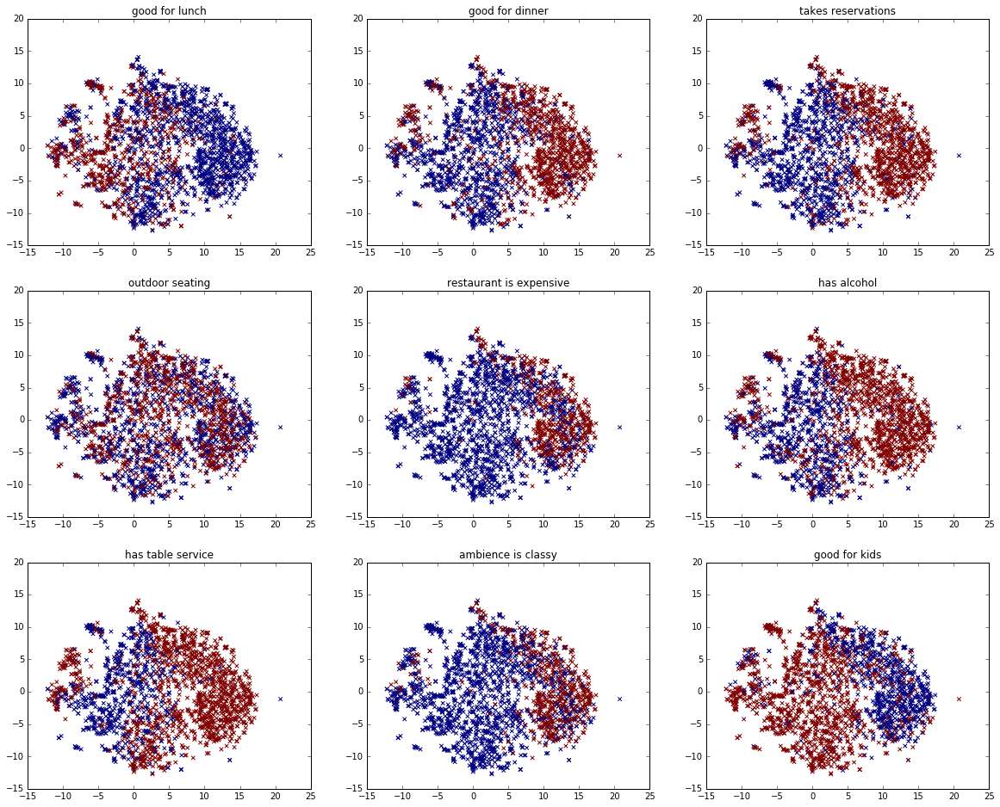

In [80]:
# plot t-SNE for concatenated fc7 features
n_classes = len(yelp_dict)

plt.rcParams['figure.figsize'] = (20.0, 50.0)

for cl in range(n_classes):
    plt.subplot(n_classes, 3, cl+1)
    plt.scatter(X_embedded[:,0], X_embedded[:,1], 
                c=train_biz_labels_dummies[[cl]],
                marker='x')
    plt.title(yelp_dict[cl])

Outdoor seating does not look at all separable.  Note, we see correlations between plots in the placement of the colored regions, as we'd expect from the corrplot in `0_explore_data.ipynb`.

## Multi-instance problem - average fc6 and fc7 features (separately) per restaurant, then concatenate to form one longer feature vector per restaurant

In [81]:
# Load fc6 features for training set
_, features_fc6 = load_photo_features('train_fc6_features.h5')

photo_id shape:  (234842,)
first few photo ids:  [204149  52779 278973]
features shape:  (234842, 4096)


In [82]:
# calculate mean fc6 features per business_id

fc6_means_per_business = np.zeros((len(train_biz_labels),features_fc6.shape[1]))

#photo_id_Series = pd.Series(photo_id)

tic = time.time()

for idx, b in enumerate(train_biz_labels.index):
    photos_of_b = train_photo_to_biz.loc[train_photo_to_biz['business_id'] == b, 'photo_id']
    mask = np.array(photo_id_Series.isin(photos_of_b))
    fc6_means_per_business[idx,:] = features_fc6[mask, :].mean(axis=0)
    if idx % 400 == 0: print(idx)

toc = time.time()
print('computed in {0}s'.format(toc-tic))

0
400
800
1200
1600
computed in 24.441276788711548s


In [83]:
# save calculated means to file
pd.DataFrame(fc6_means_per_business, index=train_biz_labels.index).to_csv(data_root+'fc6_means_per_business.csv', index_label='business_id')

How does t-SNE look for fc6 feature vectors?

In [84]:
X_reduced = TruncatedSVD(n_components=50, random_state=42).fit_transform(fc6_means_per_business)
X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(X_reduced)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 10.136642
[t-SNE] Iteration 25: error = 1.6675220, gradient norm = 0.0092315
[t-SNE] Iteration 50: error = 1.5742589, gradient norm = 0.0088686
[t-SNE] Iteration 75: error = 1.3198262, gradient norm = 0.0034715
[t-SNE] Iteration 100: error = 1.2907931, gradient norm = 0.0049072
[t-SNE] Error after 100 iterations with early exaggeration: 1.290793
[t-SNE] Iteration 125: error = 1.2262014, gradient norm = 0.0033032
[t-SNE] Iteration 150: error = 1.2156384, gradient norm = 0.0043127
[t-SNE] Iteration 175: error = 1.2168794, gradient norm = 0.0046087
[t-SNE] Iteration 200: error = 1.2206802, gradient norm = 0.0049090
[t-SNE] Iteration 200: did not make any progress during the last 30 episodes. Finished.
[t-SNE] Error after 200 iterations: 1.220680


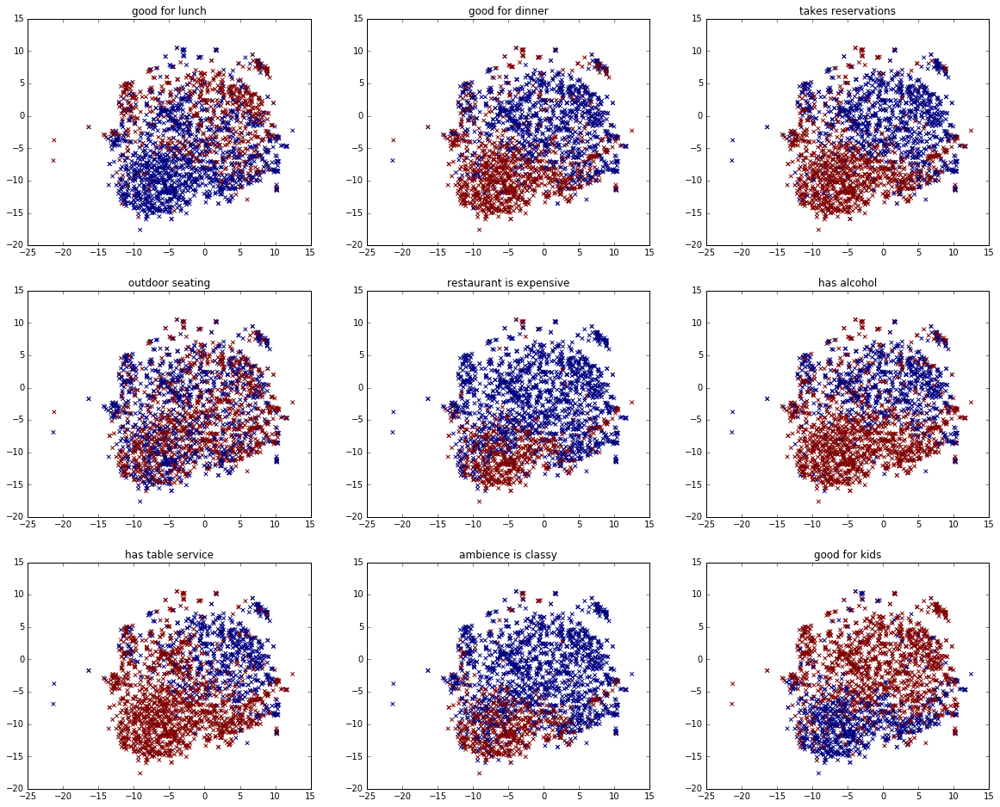

In [85]:
# plot t-SNE for fc6 features

for cl in range(n_classes):
    plt.subplot(n_classes, 3, cl+1)
    plt.scatter(X_embedded[:,0], X_embedded[:,1], 
                c=train_biz_labels_dummies[[cl]],
                marker='x')
    plt.title(yelp_dict[cl])

Separability of the classes in fc6-space seems comparable to that in fc7-space (since some labels in fc7 seem to consist of disconnected regions).  Outdoor seating still looks non-separable.

t-SNE on concated fc6 and fc7 vectors.  (Note, fc6 and fc7 are the same dimension, so won't bother normalizing each before concatenating, since that would just result in scaling the final vector by a constant.)

In [87]:
X_reduced = TruncatedSVD(n_components=50, random_state=42).fit_transform(np.hstack((fc6_means_per_business, fc7_means_per_business)))
X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(X_reduced)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 10.858005
[t-SNE] Iteration 25: error = 1.6570594, gradient norm = 0.0091539
[t-SNE] Iteration 50: error = 1.5628150, gradient norm = 0.0084481
[t-SNE] Iteration 75: error = 1.3073357, gradient norm = 0.0030705
[t-SNE] Iteration 100: error = 1.2743399, gradient norm = 0.0042789
[t-SNE] Error after 100 iterations with early exaggeration: 1.274340
[t-SNE] Iteration 125: error = 1.2120302, gradient norm = 0.0020760
[t-SNE] Iteration 150: error = 1.1996067, gradient norm = 0.0030996
[t-SNE] Iteration 175: error = 1.2006695, gradient norm = 0.0031916
[t-SNE] Iteration 200: error = 1.2015659, gradient norm = 0.0040968
[t-SNE] Iteration 200: did not make any progress during the last 30 episodes. Finished.
[t-SNE] Error after 200 iterations: 1.201566


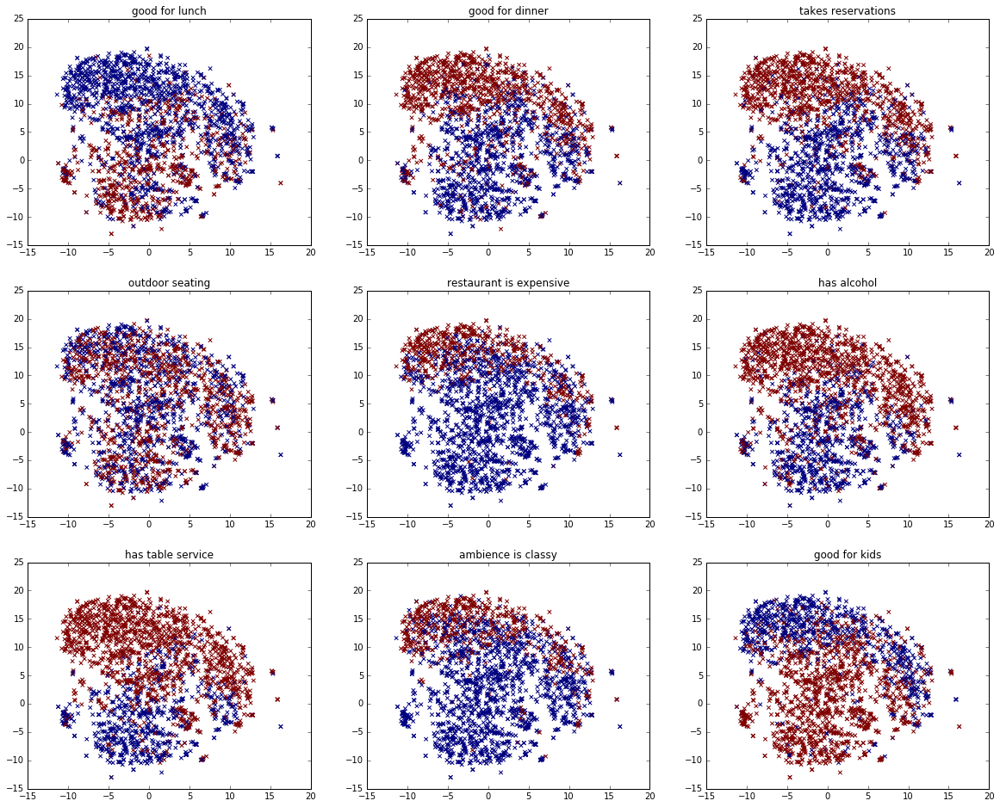

In [88]:
# plot t-SNE for concatenated fc6 and fc7 features

for cl in range(n_classes):
    plt.subplot(n_classes, 3, cl+1)
    plt.scatter(X_embedded[:,0], X_embedded[:,1], 
                c=train_biz_labels_dummies[[cl]],
                marker='x')
    plt.title(yelp_dict[cl])